<a href="https://colab.research.google.com/github/fido777/TratamientoSignal3/blob/main/Miniproyecto1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

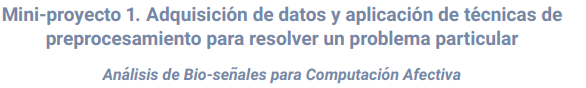

**Estudiante:**
*   Jose Daniel Rivera


**Laboratorio Tratamiento de Señales III**

**Facultad de Ingeniería**

**Universidad de Antioquia**

---

El Dataset se compone de la siguiente manera:

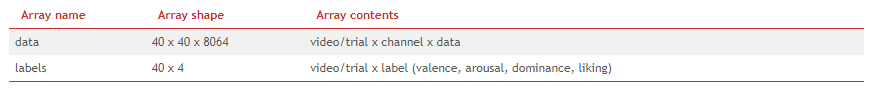

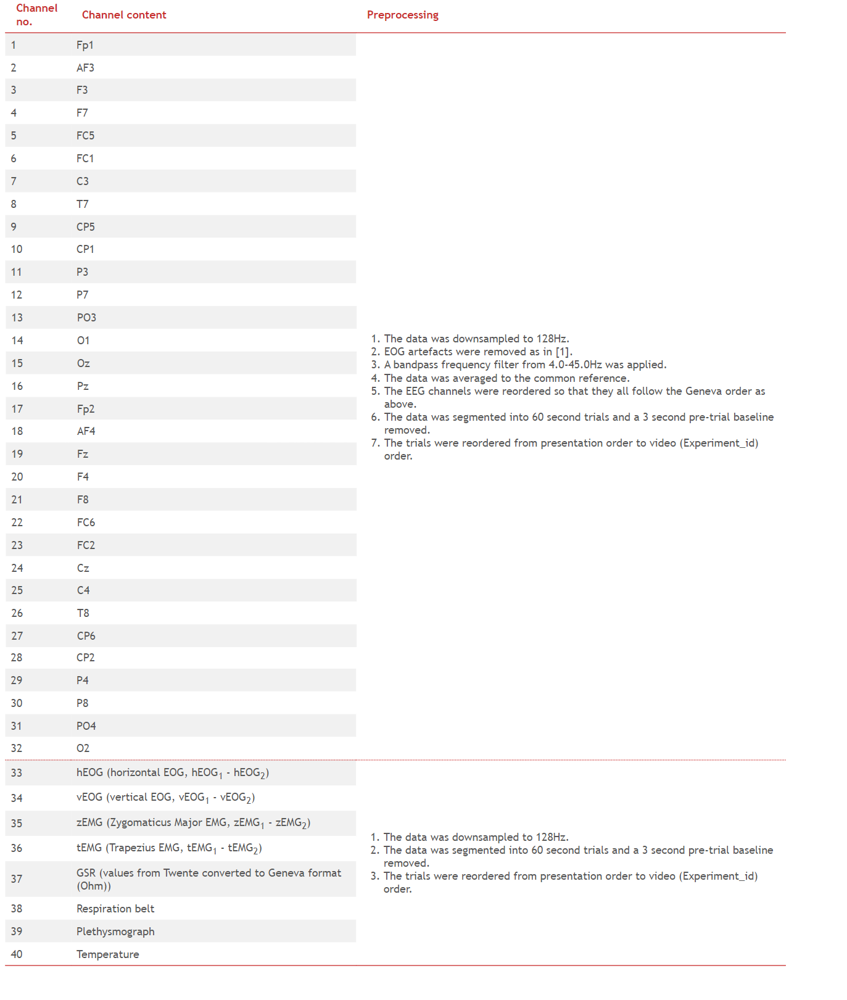

In [ ]:
!gdown '1cNMil1P60z-XrqExnnKvmggmXWhI3glZ'
!gdown '1Fu3HL-cB64lTfuZS8iPhIfaJIsl1OszD'
!gdown '1cBN0CYdrsUsVO77PyNq-Jkyh5pc0FI22'
!gdown '1bMObQcIFrNalRmD1LaNuqVSTeqaeGqR3'


Downloading...
From: https://drive.google.com/uc?id=1cNMil1P60z-XrqExnnKvmggmXWhI3glZ
To: /content/s14.mat
100% 80.6M/80.6M [00:00<00:00, 137MB/s]
Downloading...
From: https://drive.google.com/uc?id=1Fu3HL-cB64lTfuZS8iPhIfaJIsl1OszD
To: /content/s15.mat
100% 80.7M/80.7M [00:00<00:00, 116MB/s]
Downloading...
From: https://drive.google.com/uc?id=1cBN0CYdrsUsVO77PyNq-Jkyh5pc0FI22
To: /content/s16.mat
100% 80.8M/80.8M [00:01<00:00, 78.8MB/s]
Downloading...
From: https://drive.google.com/uc?id=1bMObQcIFrNalRmD1LaNuqVSTeqaeGqR3
To: /content/s17.mat
100% 80.7M/80.7M [00:00<00:00, 116MB/s]


In [ ]:
# Cargar el archivo .mat
import scipy.io as sc
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from collections import Counter

In [ ]:
datosP1 = sc.loadmat('s14.mat')
datosP2 = sc.loadmat('s15.mat')
datosP3 = sc.loadmat('s16.mat')
datosP4 = sc.loadmat('s17.mat')

In [ ]:
######## Paciente 1 ############
signals_P1 = datosP1['data']
etiquetas_P1 = datosP1['labels']

######## Paciente 2 ############
signals_P2 = datosP2['data']
etiquetas_P2 = datosP2['labels']

######## Paciente 3 ############
signals_P3 = datosP3['data']
etiquetas_P3 = datosP3['labels']

######## Paciente 4 ############
signals_P4 = datosP4['data']
etiquetas_P4 = datosP4['labels']


In [ ]:
from scipy.signal import butter, lfilter, freqz, sosfilt
from scipy import signal
from scipy.fft import fft
from scipy.signal import find_peaks

def butter_lowpass(cut, fs, order):

    sos_fil = butter(order, cut, btype='low',output='sos',fs=128,analog=False)
    return sos_fil

def butter_lowpass_filter(data, cut, fs, order):
    sos = butter_lowpass(cut, fs, order=order)
    w, h = signal.sosfreqz(sos)
    y = sosfilt(sos,data)
    return y

def butter_bandpass(lowcut, highcut, fs, order):

    sos_fil = butter(order, [lowcut, highcut], btype='band',output='sos',fs=128,analog=False)
    return sos_fil

def butter_bandpass_filter(data, lowcut, highcut, fs, order):
    sos = butter_bandpass(lowcut, highcut, fs, order=order)
    y = sosfilt(sos,data)
    return y

# GSR

1. Average Skin Resistance
2. Average Rising Time
3. 10 Spectral power in the [0-2.4]Hz bands

In [ ]:
def GSR(trial, PacienteX):
  channel = 37
  skin_resistance = PacienteX[trial-1,channel-1,:]
  caracteristicas = []

  #Calcular la resistencia media de la piel
  average_skin_resistance = round(np.average(skin_resistance),4)
  caracteristicas.append(average_skin_resistance)

  #Calcular el tiempo medio de subida
  def calculate_rising_time(skin_resistance):
    contador = 0
    time = []
    for i in range(len(skin_resistance) - 1):
        if skin_resistance[i + 1] >= skin_resistance[i]:
            contador += 1
        else:
            if contador > 32:
                time.append(contador)
            contador = 0
    if contador > 32:
        time.append(contador)
    return time
  time = []
  rising_times = calculate_rising_time(skin_resistance)
  for contador in rising_times:
    time.append(contador / 128)

  average_rising_time = round(np.average(time), 4)
  caracteristicas.append(average_rising_time)

  #10 Potencias espectral en las bandas [0-2,4]Hz
  filtered_skin_resistance = butter_lowpass_filter(skin_resistance, cut=2.4, fs=128, order=8)
  ts = len(filtered_skin_resistance)/128.
  time = np.linspace(0,ts,len(filtered_skin_resistance))

  #calcular FFT y potencia espectral
  yf = fft(filtered_skin_resistance)
  yf_aux = 2.0/len(filtered_skin_resistance) * np.abs(yf[1:len(filtered_skin_resistance)//2])

  for i in range(0,10):
    max_power = np.max(yf_aux)
    caracteristicas.append(max_power)
    result = np.where(yf_aux  == max_power)
    yf_aux=np.delete(yf_aux, result[0][0])

  return caracteristicas

## Blood Volume Preasure

1. Average respiration signal
2. standard deviation.
3. Spectral power in the bands ([0.1-0.2]Hz, [0.2-0.3]Hz, [0.3-0.4]Hz)

In [ ]:
def BVP(trial, PacienteX):
  caracteristicas=[]
  channel = 39 # canal de la señal fisiológica

  BloodVol = PacienteX[trial,channel-1,:]

  mean = np.nanmean(BloodVol)
  std = np.nanstd(BloodVol)

  caracteristicas.append(mean)
  caracteristicas.append(std)

  fs=128.0

  frequency_bands = [(0.1, 0.2), (0.2, 0.3), (0.3, 0.4)]
  for lowcut, highcut in frequency_bands:
    respiration = PacienteX[trial,channel-1,:]
    ts = len(respiration)/128.
    time = np.linspace(0,ts,len(respiration))
    y = butter_bandpass_filter(respiration, lowcut, highcut, fs, order=8)

    f, Pxx_den = signal.welch(y, 128., nperseg=1024)
    maximo=max(Pxx_den)
    caracteristicas.append(maximo)

  return caracteristicas

#Respiration Pattern

1. Average respiration signal

2. Breathing rate

3. Average peak to peak time

In [ ]:
def RP(trial, X):
  caracteristicas=[]
  channel = 38

  respiration = X[trial,channel-1,:]
  respiration = butter_bandpass_filter(respiration, 0.05, 1.5, 128., order=8) #Se filtra la señal para lograr un suavizado y lograr un mejor resultado
  mean = np.nanmean(respiration)

  des=np.nanstd(respiration)
  peaks2, _ = find_peaks(respiration, prominence=des)

  Num_resp=len(peaks2)

  diff_x1 = np.diff(peaks2)
  time_peak=(sum(diff_x1)/len(diff_x1))/128.

  caracteristicas.append(mean)
  caracteristicas.append(Num_resp)
  caracteristicas.append(time_peak)

  return caracteristicas

time_peak : Utilizamos la funcion find_peaks() que se encuentra dentro de la libreria de scipy para encontrar el numero de picos mas marcados que representan una respiracion de la persona. Con np.diff calculamos la diferencia entre picos consecutivos de la señal, sumamos y promediamos entre el total de picos y asi encontramos la caracteristica time_peak.

#Skin temperature

1. Average Skin Temperature
2. Average of its derivative
3. Spectral power in the bands ([0-0.1]Hz, [0.1-0.2]Hz)


In [ ]:
def ST(trial, X):
  caracteristicas=[]
  channel = 40
  skin_temperature = X[trial-1,channel-1,:]

  #Calcular la temperatura promedio de la piel
  average_skin_temperature = np.average(skin_temperature)
  caracteristicas.append(average_skin_temperature)

  #Calculating average of its derivative

  ts = len(skin_temperature)/128.
  time = np.linspace(0,ts,len(skin_temperature))
  derivative_skin_temperature = np.gradient(skin_temperature)/np.gradient(time)
  average_derivative_ST = np.average(derivative_skin_temperature)
  caracteristicas.append(average_derivative_ST)


  #Calcular la potencia espectral en las bandas ([0-0.1]Hz,[0-0.2]Hz)
  # Band [0-0.1]
  filtered_skin_temperature = butter_lowpass_filter(data = skin_temperature, cut = 0.1, fs = 128 , order = 8)

  # 2. Calculating FFT
  yf = fft(filtered_skin_temperature)
  yf_aux = 2.0/len(filtered_skin_temperature) * np.abs(yf[1:len(filtered_skin_temperature)//2])

  fs = 128 # fs
  f, Pxx_ST = signal.welch(filtered_skin_temperature, fs, nperseg=64)

  maximo1 = max(Pxx_ST)
  caracteristicas.append(maximo1)

  # Band [0.1-0.2]
  filtered_skin_temperature = butter_bandpass_filter(data = skin_temperature, lowcut = 0.1, highcut = 0.2, fs = 128 , order = 8)

  # 2. Calculating FFT

  yf = fft(filtered_skin_temperature)
  yf_aux = 2.0/len(filtered_skin_temperature) * np.abs(yf[1:len(filtered_skin_temperature)//2])

  fs = 128 # fs
  f, Pxx_ST = signal.welch(filtered_skin_temperature, fs, nperseg=64)

  maximo2 = max(Pxx_ST)
  caracteristicas.append(maximo2)

  return caracteristicas


# EMG and EOG
1. Eye blinking rate
2. mean of the signal
3. variance of the signal

In [ ]:
def EMG_EOG(trial, X):
  caracteristicas=[]
  channel = 33 # canal de la señal fisiológica

  eye = X[trial,channel-1,:]
  des = np.nanstd(eye)
  picos, _ = find_peaks(eye, prominence=des)
  Num_resp=len(picos)

  mean=np.nanmean(eye)
  var=np.nanvar(eye)

  caracteristicas.append(Num_resp)
  caracteristicas.append(mean)
  caracteristicas.append(var)

  return caracteristicas


#EEG
theta (4 to 7Hz); alpha (8 to 12Hz); beta (13 to 30Hz) spectral power for each pair of electrodes

In [ ]:
def EEG(trial, X):
    channel_pairs = [[1, 17], [3, 20], [7, 25], [11, 29], [14, 32]]
    bands = [[4, 7], [8, 12], [13, 30]]
    fs = 128

    caracteristicas = []

    for band in bands:
        for pair in channel_pairs:
            left_channel = X[trial - 1, pair[0] - 1, :]
            right_channel = X[trial - 1, pair[1] - 1, :]
            electrode_pair = left_channel - right_channel
            electrode_pair = butter_bandpass_filter(electrode_pair, band[0], band[1], fs, order=8)
            f, Pxx_electrode_pair = signal.welch(electrode_pair, fs, nperseg=64)
            potMax = np.max(Pxx_electrode_pair)
            caracteristicas.append(potMax)

    return caracteristicas


In [ ]:
def calcular_caracteristicas(trial, PacienteX):
    caracteristicas = []
    funciones = [GSR, BVP, RP, ST, EMG_EOG, EEG]

    for funcion in funciones:
        caracteristicas += funcion(trial, PacienteX)

    return caracteristicas

Matriz=[]

señales= [signals_P1,signals_P2,signals_P3,signals_P4]
for i in señales:
  for j in range(40):
    Matriz.append(calcular_caracteristicas(j, i))

print(np.shape(Matriz))


(160, 42)


Despues de haber hecho el calculo de las caracteristicas para cada una de las señales nos queda un vector de (160,42), donde cada señal consta de 40 videos, y en total calculamos 42 caracteristicas.


#Etiquetas emocionales
Cada una de las realizaciones induce una emoción en los sujetos. Por lo tanto cada realización (de las 40) tiene sus correspondientes etiquetas de la forma:

Los modelos dimensionales sugieren que la emoción se entiende mejor cuando ocurre dentro de un espacio dimensional, más comúnmente un espacio bidimensional que abarca la valencia y la excitación. La valencia emocional describe el grado en que una emoción es positiva o negativa, mientras que la excitación se refiere a su intensidad, es decir, la fuerza del estado emocional asociado.

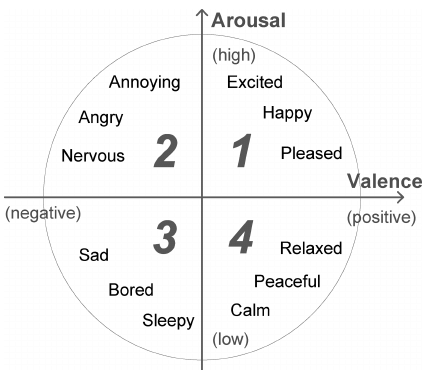

#Visualización de las etiquetas emocionales
Para esto, se realizará un agrupamiento de las etiqeutas en 3 grupos:

1. Emociones Negativas: arousal [1-3]y valence [1-3]
.
2. Emociones Neutras: arousal [4-6] y valence [4-6]
.
3. Emociones Positivas: arousal [7-9] y valence [7-9]

In [ ]:
etiquetas_P1
valence=etiquetas_P1[:,0]
valence


array([8.22, 6.05, 7.5 , 7.38, 3.99, 7.19, 6.85, 7.  , 7.69, 1.88, 8.03,
       7.63, 6.79, 8.03, 7.08, 3.96, 6.06, 8.09, 7.55, 7.33, 1.03, 4.1 ,
       2.41, 2.36, 3.87, 3.28, 5.81, 2.53, 2.92, 1.1 , 3.26, 1.99, 3.18,
       2.5 , 2.68, 2.01, 3.47, 2.26, 6.65, 6.68])

In [ ]:

Neg = 'Neg'
Neu = 'Neu'
Pos = 'Pos'
emociones=[]
etiquetas = [etiquetas_P1, etiquetas_P2, etiquetas_P3, etiquetas_P4]

for labels in etiquetas:

  Valence = labels[:,0]
  Arousal = labels[:,1]

  for i in range(0,40):

    if(Valence[i]>=1 and Valence[i]<=3.3):
      emociones.append(Neg)
    if(Valence[i]>3.3 and Valence[i]<=6):
      emociones.append(Neu)
    if(Valence[i]>6):
      emociones.append(Pos)



# Crear un contador de emociones
contador_emociones = Counter(emociones)

# Obtener la cantidad de veces que aparece cada emoción
for emocion, cantidad in contador_emociones.items():
    print(f"{emocion}: {cantidad} veces")



Pos: 61 veces
Neu: 59 veces
Neg: 40 veces


In [ ]:
Nombres = ['GSR_ASR','GSR_ART','GSR_SP1','GSR_SP2','GSR_SP3','GSR_SP4','GSR_SP5','GST_SP6','GST_SP7','GST_SP8','GST_SP9','GST_SP10','BVP_AHR','BVP_STD',
'BVP_SP1','BVP_SP2','BVP_SP3','RP_ARS','RP_BR','RP_AP2P','ST_AST','ST_AD','ST_SP1','ST_SP2','EMG_EBR','EMG_MEAN','EMG_VAR','EEG_SPT1','EEG_SPT2',
'EEG_SPT3','EEG_SPT4','EEG_SPT5','EEG_SPA1','EEG_SPA2','EEG_SPA3','EEG_SPA4','EEG_SPA5','EEG_SPB1','EEG_SPB2','EEG_SPB3','EEG_SPB4','EEG_SPB5']

dataFrame = pd.DataFrame(data = Matriz, columns= Nombres)

dataFrame['emociones'] = emociones
SubData1 = dataFrame.iloc[:,20:30]
SubData1['emociones'] = emociones

SubData1

,ST_AST,ST_AD,ST_SP1,ST_SP2,EMG_EBR,EMG_MEAN,EMG_VAR,EEG_SPT1,EEG_SPT2,EEG_SPT3,emociones
0,-0.021413,-0.000833,7.931182e-09,1.180841e-09,34,136.208838,10546.012182,550.853795,1078.967932,101.412710,Pos
1,-0.075441,-0.004901,3.856316e-08,4.114540e-09,27,126.371641,5668.335909,147.476741,307.674848,29.582185,Pos
2,-0.054506,-0.001598,2.420741e-08,1.425929e-09,30,56.412647,6200.040770,237.855746,551.643026,46.441381,Pos
3,-0.132064,-0.005019,5.890808e-08,1.833356e-09,32,44.034539,4341.913184,193.837319,344.284362,36.097525,Pos
4,-0.017212,-0.000990,3.874153e-09,1.565707e-09,7,-414.977428,43946.240570,238.712529,475.178856,47.804590,Neu
...,...,...,...,...,...,...,...,...,...,...,...
155,0.025707,0.001617,4.034406e-08,2.266201e-10,84,-25.168147,1636.043778,2.997572,8.744306,3.123474,Neu
156,0.089737,0.002529,2.643677e-08,1.098172e-09,38,57.859560,2513.390468,2.726431,12.732410,4.163815,Neu
157,-0.157343,-0.004431,8.064061e-08,2.306633e-09,83,39.574165,1288.537522,3.519900,12.385321,3.709089,Neu
158,0.134761,0.006313,1.040703e-07,6.634277e-11,69,88.434316,2784.636011,5.682120,15.197266,4.260141,Pos


In [ ]:
sns.set_style('darkgrid')

unique = dataFrame["emociones"].unique()
palette = dict(zip(unique, sns.color_palette(n_colors=len(unique))))

ax = sns.pairplot(data=dataFrame,  hue='emociones', palette=palette, corner = True)
#sns.pairplot(, hue="Tipo Mov",corner = True)
plt.tight_layout()
plt.figure()

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

#Analisis

Dentro de la delimitación de los rangos utilizados para categorizar las emociones manifestadas por los participantes durante las pruebas, observamos una distribución equitativa de las distintas emociones. La emoción menos comúnmente registrada es la clasificada como 'negativa', con tan solo 40 casos identificados, mientras que las emociones 'positivas' y 'neutrales' cuentan con 61 y 59 casos, respectivamente.

En general, los datos relacionados con emociones neutrales tienden a presentar una menor dispersión, lo que indica que se agrupan en una región más específica en las visualizaciones. No obstante, se destacan casos interesantes, como el de la característica EEG_SPB1, donde las emociones positivas exhiben una menor dispersión en comparación con las otras dos emociones, agrupándose de manera más pronunciada en el centro del eje y de los gráficos.

En algunas representaciones visuales, como las filas correspondientes a las características EMG_VAR y EMG_MEAN, se pueden identificar valores atípicos que se alejan notoriamente de la media de los demás valores. Esto podría indicar que durante la visualización de determinados videos, las emociones experimentadas fueron particularmente intensas, lo que llevó a que estas características se desviaran significativamente de la norma.

Es interesante destacar que, en general, los valores asociados con las emociones neutrales suelen superponerse con los de las otras dos categorías emocionales, sugiriendo que las emociones neutrales pueden adquirir características de las emociones positivas o negativas, aunque de manera menos prominente en el observador, lo que justifica su categorización como emociones 'neutrales'.

Por otro lado, en el caso de la característica BVP_SP1, los datos revelan que las emociones positivas tienden a mostrar una menor dispersión, mientras que los valores asociados a las emociones negativas tienden a tomar valores más positivos en el eje Y. Esto podría indicar que esta característica en particular podría ser útil para distinguir entre emociones positivas y negativas.

Un hallazgo intrigante se produce al analizar dos características derivadas del patrón de respiración: la relación entre la tasa de respiración (Breathing rate) y el tiempo promedio entre picos de respiración (Avg peak to peak time). Esta relación presenta una forma similar a una exponencial decreciente, lo cual es coherente: a medida que la tasa de respiración aumenta, el tiempo entre los picos de respiración disminuye. Este descubrimiento sugiere que esta relación podría ser aprovechada para predecir estados emocionales en futuros participantes o situaciones mediante técnicas de interpolación.

#Conclusiones

1. Tras un análisis exhaustivo del conjunto de datos DEAP, se observa una distribución emocional bastante equilibrada, con emociones positivas, negativas y neutrales representadas de manera similar. Esto sugiere que el conjunto de datos proporciona una base sólida para explorar una variedad de estados emocionales.

2. Se identificaron características fisiológicas, como BVP_SP1, que muestran diferencias significativas entre emociones positivas y negativas. Esto indica que estas características específicas pueden servir como indicadores clave para distinguir entre estas dos categorías emocionales en futuros análisis o aplicaciones.

3. La presencia de valores atípicos en ciertas características, como EMG_VAR y EMG_MEAN, sugiere que las emociones intensas pueden llevar a desviaciones notables de las medias. Esto resalta la importancia de considerar la variabilidad individual en las respuestas emocionales al analizar datos fisiológicos.

4. Se observó que las emociones neutrales a menudo se superponen con las emociones positivas y negativas en varias características. Esto sugiere que las emociones neutrales pueden presentar rasgos de ambas categorías, lo que podría deberse a una respuesta emocional menos intensa pero aún influenciada por los estímulos.

5. El análisis del patrón de respiración reveló una relación interesante entre la tasa de respiración y el tiempo promedio entre picos de respiración. Esta relación podría ser utilizada para predecir estados emocionales, lo que abre oportunidades para investigaciones futuras en el campo de la detección y predicción de emociones basadas en señales fisiológicas.